# Notes

This notebook is an example of a PRE-PROCESSING and SEGMENTATION pipeline for satellite images.
It is not meant to be run as a script, but rather to be used as a reference for how to use the preprocessing and segmentation functions.

**IMPORTANT** This notebook assumes one has stored a series of *unpacked* RAS and RHD files in the VISTA format containing 
- The RGB (red,green,blue) reflectance values as a tensor of images over time (bands B2, B3, B4).
- The NIR (near-infrared) reflectance values as a tensor of images over time (band B8A).
- Information of the datetimes and the coordinates of the images. 

The VISTA format is not publicly available, but the functions in this notebook can be used as a reference for how to preprocess satellite images in general.

*Example scenario*: We have downloaded the RAS and RHD files containing the RGBNIR and SCL values for a sentinel-2 tile (~12k by 12k image) over the span of 2020. We want to preprocess this data for segmentation of fields.

*Author*: Jens d'Hondt (TU Eindhoven)

In [1]:
# General imports
import os
import datetime as dt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import sys
from stelar_spatiotemporal.eolearn.core import EOPatch, OverwritePermission, FeatureType, SaveTask, LoadTask
import geopandas as gpd

/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/src/modules/segmentation/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Set minio credentials
os.environ["MINIO_ACCESS_KEY"] = "axCLdM37tNuR3N1dSQLm"
os.environ["MINIO_SECRET_KEY"] = "Wyl9QM8XooqH07aWMoH0jawgSBVGMQUSm3Y0PI8M"
os.environ["MINIO_ENDPOINT_URL"] = "https://api-s3-vista.stelar.gr"

DEMO_BUCKET = "s3://klms"

TILE = "33UUP"

RGB_PATH = f"{DEMO_BUCKET}/Pilot_B/UCB2/{TILE}/FIELD_SEGMENTATION/INPUT"
OUT_PATH = f"{DEMO_BUCKET}/Pilot_B/UCB2/{TILE}/FIELD_SEGMENTATION/OUTPUT"
MODEL_PATH = f"/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/model/resunet-a_fold-0_2023-03-27-09-29-38"

LOCAL_DIR = "/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023"

segment_dates = [dt.datetime(2023, 5, 28)]

# 0 Unpacking the data

This step unpacks a RAS-RHD file pair with reflection band values into a series of .npy files, named by the date of the image and aggregated by the band name.
(e.g. `B2/2020_1_1.npy`, `B2/2020_1_2.npy`, ...) 
The unpacking can be done using the `unpack_vista_unzipped` function in `stelar_spatiotemporal/preprocessing/vista_preprocessing.py`, as shown below.

**Assumptions**:
- One has downloaded and unzipped the RAS and RHD files for all necessary bands [B2,B3,B4,B8A] to be processed. And stored them in folders grouped by the respective band name. E.g.,:
```
B2/
    2020_1_1.RAS
    2020_1_1.RHD
    2020_1_2.RAS
    2020_1_2.RHD
    ...
B3/
    2020_1_1.RAS
    2020_1_1.RHD
    2020_1_2.RAS
    2020_1_2.RHD
    ...
B4/
    2020_1_1.RAS
    2020_1_1.RHD
    2020_1_2.RAS
    2020_1_2.RHD
    ...
B8A/
    2020_1_1.RAS
    2020_1_1.RHD
    2020_1_2.RAS
    2020_1_2.RHD
    ...
```
- The RAS files can contain multiple images, each with a different date, month or year.

**Process**:
The function `unpack_vista_unzipped` will do the following:
1. Extract the images from the RAS file and store them in a series of .npy files named by the date of the individual image, based on the accompanied RHD file.

In [4]:
from sentinelhub import CRS
from stelar_spatiotemporal.preprocessing.vista_preprocessing import BandsDataPackage, unpack_vista_reflectance

b2_path = os.path.join(RGB_PATH, "B2")
b3_path = os.path.join(RGB_PATH, "B2")
b4_path = os.path.join(RGB_PATH, "B2")
b8_path = os.path.join(RGB_PATH, "B2")

bands_data_package = BandsDataPackage(b2_path, b3_path, b4_path, b8_path, file_extension="RAS")

# Unpacks RAS and RHD files into numpy arrays
# unpack_vista_reflectance(bands_data_package, outdir=TMPDIR, crs=CRS(32630))

# 1. Combining bands for segmentation data

In this step we will combine the different bands into a tensor, or package of images. 
As we will only perform segmentation over a small selection of images (particularly, certain dates with good weather and representative field separation), we advice to pass this selection into the function `combine_bands` as a list of dates.
Otherwise, the function will combine all images in the specified folder into a tensor, which can be very large and unnecessary if one then only uses a subset of those images for segmentation.

**Assumptions**:
- One has stored the .npy files containing the images of each band in a folder `$DATADIR` following the structure `DATADIR/{B2,B3,B4,B8A}/{date}.npy`.

**Process**:
The function `combine_bands` will do the following:
1. Create a tensor of images for the RGBNIR bands (B2, B3, B4, B8A).
2. Combine the tensor of images, the mask, the corresponding datetimes and bounding box into a single EOPatch object and save in folder `DATADIR/segment_eopatch`.

In [6]:
from stelar_spatiotemporal.segmentation.segmentation import combine_rgb_npys_into_eopatch

TMPDIR = "/tmp"

# Create band data package with local paths
b2_path = os.path.join(TMPDIR, 'rgb', "B2")
b3_path = os.path.join(TMPDIR, 'rgb', "B3")
b4_path = os.path.join(TMPDIR, 'rgb', "B4")
b8_path = os.path.join(TMPDIR, 'rgb', "B8A")

npy_data_package = BandsDataPackage(b2_path, b3_path, b4_path, b8_path, file_extension="npy")

eop_path = combine_rgb_npys_into_eopatch(npy_data_package, outdir=TMPDIR, dates = segment_dates)

print(eop_path)

Combining segment dates into one eopatch per band
Processing 1 partitions of 1 dates each
Processing 1 partitions of 1 dates each
Processing 1 partitions of 1 dates each
Processing 1 partitions of 1 dates each
Combining eopatches into one eopatch
Saving eopatch
/tmp/segment_eopatch


# 2. Splitting segmentation data to patchlets

Next, we will split the EOPatch containing the data for the full tile (12k by 12k pixels) into smaller patchlets (1128 by 1128 pixels) with slight overlap between them. This is done to make the data more manageable for the next steps in the pipeline, particularly segmentation, for which the model works best with smaller images.

**Assumptions**:
- One has stored the EOPatch object containing the data for the full tile in a folder `$DATADIR/segment_eopatch`.

In [7]:
from stelar_spatiotemporal.segmentation.segmentation import patchify_segmentation_data

plet_dir = os.path.join(TMPDIR, "patchlets")

patchify_segmentation_data(eop_path, outdir=plet_dir, n_jobs=1)

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:15<00:00, 15.34s/it]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


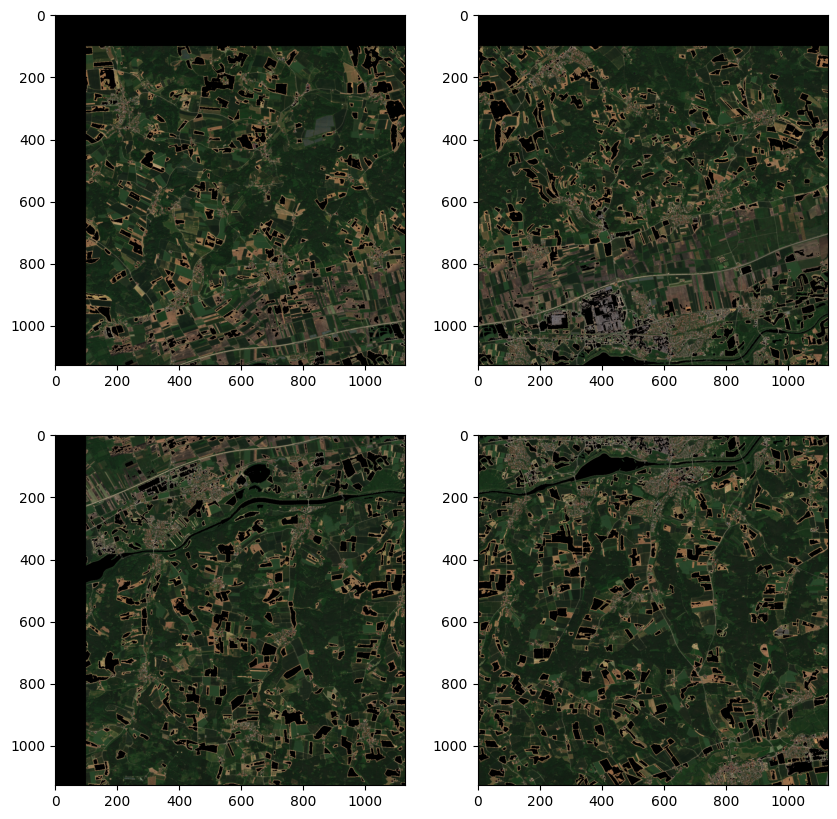

In [8]:
from stelar_spatiotemporal.eopatch_functions import plot_rgb
from stelar_spatiotemporal.eolearn.core import EOPatch

# Check patchlets results (with overlap)
indir = plet_dir
eop1 = EOPatch.load(indir + "/patchlet_0_0", lazy_loading=True)
eop2 = EOPatch.load(indir + "/patchlet_1_0", lazy_loading=True)
eop3 = EOPatch.load(indir + "/patchlet_0_1", lazy_loading=True)
eop4 = EOPatch.load(indir + "/patchlet_1_1", lazy_loading=True)

fig,axes = plt.subplots(2,2,figsize=(10,10))

plot_rgb(eop1, 0, axes[0,0])
plot_rgb(eop2, 0, axes[0,1])
plot_rgb(eop3, 0, axes[1,0])
plot_rgb(eop4, 0, axes[1,1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Axes: >

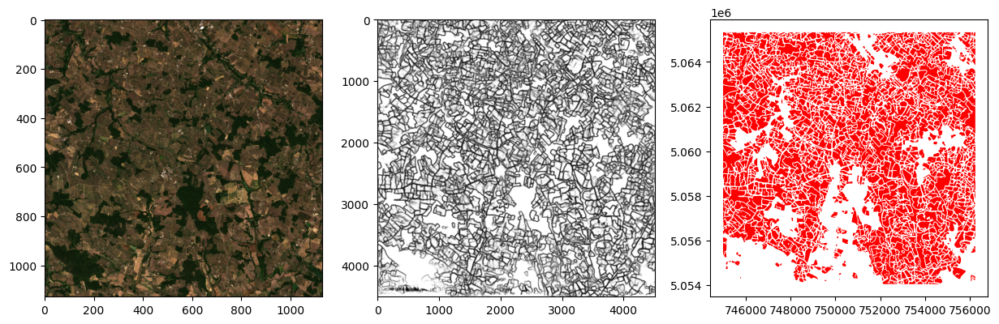

In [35]:
eop = EOPatch.load(indir + "/patchlet_4_3", lazy_loading=True)

fig,axes = plt.subplots(1,3, figsize=(15,5))

# Plot RGB image
rgb_data = eop.data['BANDS'][0]
axes[0].imshow(rgb_data[..., [2,1,0]] / 10000 * 3.5)

# Plot segmentation mask
seg_data = eop.data_timeless['SEGMENTATION']
axes[1].imshow(seg_data, vmin=0, vmax=1, cmap='gray')

# Plot fields
field_path = "/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/VISTA/VISTA_workbench/data/pipeline_example/contours/patchlet_4_3.gpkg"

fields = gpd.read_file(field_path)

# Fiter fields on area
minarea = 1000 # 1 km2
maxarea = 500_000 # 50 hectares

fields = fields[(fields.geometry.area > minarea) & (fields.geometry.area < maxarea)]
fields.plot(ax=axes[2], color='red')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


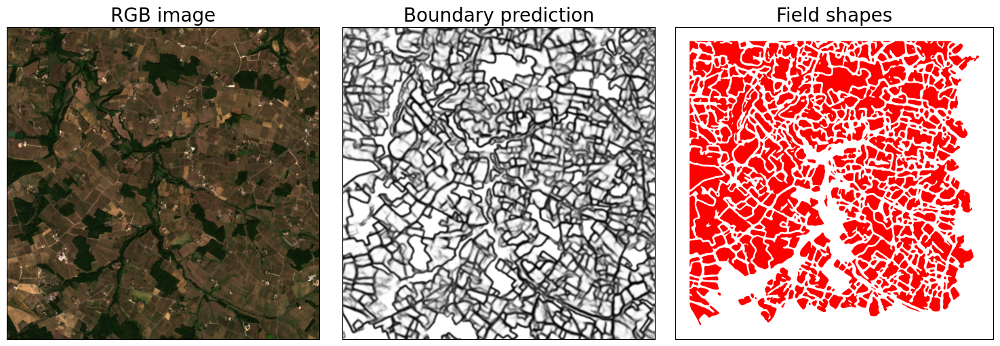

In [55]:
# Now filter to first quadrant
fig, axes = plt.subplots(1,3, figsize=(15,5))

title_fontsize = 20

# Plot RGB image
w,h = rgb_data.shape[:2]
axes[0].imshow(rgb_data[:int(w/2),:int(h/2), [2,1,0]] / 10000 * 3.5)
axes[0].set_title("RGB image", fontsize=title_fontsize)
axes[0].set_xticks([])
axes[0].set_yticks([])

# Plot segmentation mask
w,h = seg_data.shape[:2]
axes[1].imshow(seg_data[:int(w/2),:int(h/2)], vmin=0, vmax=1, cmap='gray')
axes[1].set_title("Boundary prediction", fontsize=title_fontsize)
axes[1].set_xticks([])
axes[1].set_yticks([])

# Plot fields
xmin, ymin, xmax, ymax = fields.total_bounds
w = (xmax - xmin) * .45
h = (ymax - ymin) * .45
fields_view = fields.cx[xmin:xmin+w, ymax-h:ymax]

fields_view.plot(ax=axes[2], color='red')
axes[2].set_title("Field shapes", fontsize=title_fontsize)
axes[2].set_xticks([])
axes[2].set_yticks([])

plt.tight_layout()
plt.show()

In [41]:
w,h

(378127.5, 2532662.5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


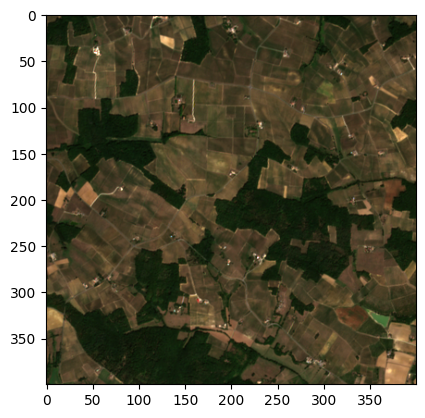

In [10]:
data = eop.data['BANDS'][0]

data = data[600:1000, :400, :]

plt.imshow(data[..., [2,1,0]] / 10000 * 3.5)

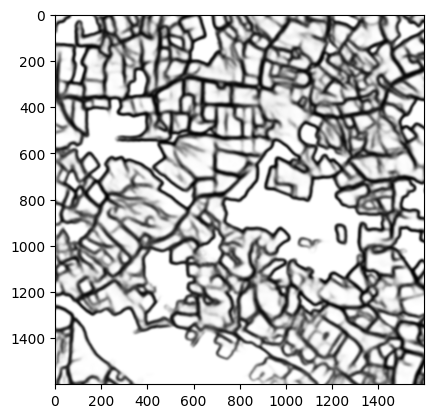

In [18]:
data = eop.data_timeless['SEGMENTATION']

xmin, xmax = 600, 1000
ymin, ymax = 0, 400

xmin *= 4
xmax *= 4
ymin *= 4
ymax *= 4

data = data[xmin:xmax, ymin:ymax, 0]

plt.imshow(data, vmin=0, vmax=1, cmap='gray')

In [25]:
# Map the ranges of pixels to coordinates in the original image using eop.bbox

bbox = eop.bbox

view_xmin, view_xmax = 600, 1000
view_ymin, view_ymax = 0, 400

w_px_ratio = (bbox.max_x - bbox.min_x) / 1128
h_px_ratio = (bbox.max_y - bbox.min_y) / 1128

xmin = bbox.min_x + view_xmin * w_px_ratio
xmax = bbox.min_x + view_xmax * w_px_ratio
ymin = bbox.min_y + view_ymin * h_px_ratio
ymax = bbox.min_y + view_ymax * h_px_ratio

xmin, xmax, ymin, ymax

(750975.0, 754975.0, 5054045.0, 5058045.0)

<Axes: >

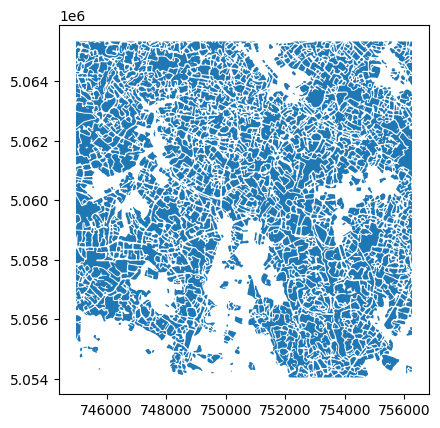

In [32]:
# Get fields

field_path = "/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/VISTA/VISTA_workbench/data/pipeline_example/contours/patchlet_4_3.gpkg"

fields = gpd.read_file(field_path)

# Fiter fields on area
minarea = 1000 # 1 km2
maxarea = 500_000 # 50 hectares

fields = fields[(fields.geometry.area > minarea) & (fields.geometry.area < maxarea)]

# Filter fields on location
# field_view = fields.cx[xmin:xmax, ymin:ymax]

fields.plot()

# field_view

# 3. Segmentation

In this step we will perform segmentation on the patchlets. We will use a pre-trained U-Net model with a ResNet34 backbone. The model will run inference on each of the images (i.e., dates) in the patchlets and combine those predictions to form a segmentation map for the patchlet. The segmentation map will be stored in the EOPatch object under the feature name `SEGMENTATION`.

**Assumptions**:
- One has stored the EOPatch objects containing the patchlets in a folder `$DATADIR/patchlets/segment_eopatch`.
- One has stored the pre-trained model in a folder `$MODELDIR`.

**Process**:
The function `segment_patchlets` will do the following:
1. Load the pre-trained model.
2. Run inference on each of the images in the patchlets.
3. Combine the predictions into a segmentation map for the patchlet.
4. Save the segmentation map in the EOPatch object under the feature name `SEGMENTATION`.

In [7]:
from stelar_spatiotemporal.segmentation.segmentation import segment_patchlets, load_model

segment_patchlets(MODEL_PATH, plet_dir)

Loading model
1/144: Segmenting /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/patchlets/patchlet_1_9
Skipping /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/patchlets/patchlet_1_9 as it is already segmented
2/144: Segmenting /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/patchlets/patchlet_0_4
Skipping /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/patchlets/patchlet_0_4 as it is already segmented
3/144: Segmenting /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/patchlets/patchlet_4_3
Skipping /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/patchlets/patchlet_4_3 as it

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


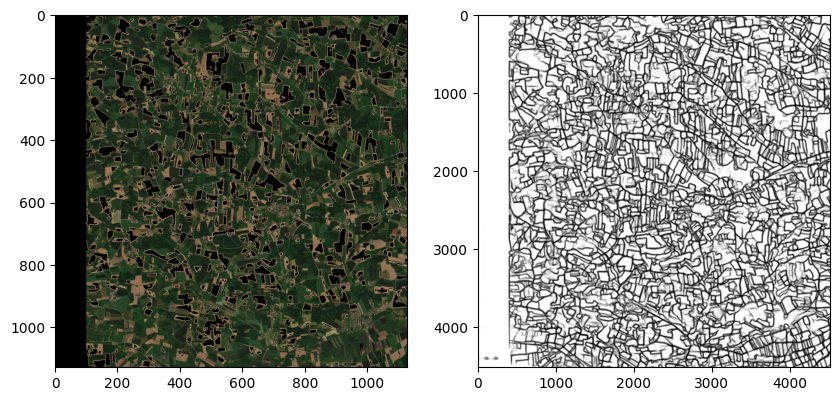

In [19]:
from stelar_spatiotemporal.eopatch_functions import plot_rgb

plet_dir = '/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023'

# Check prediction
patchlet_path = os.path.join(plet_dir, "patchlet_0_4")
eop = EOPatch.load(patchlet_path, lazy_loading=True)

fig,axes = plt.subplots(1,2,figsize=(10,10))
plot_rgb(eop, 0, axes[0])
axes[1].imshow(eop.data_timeless['SEGMENTATION'][...,0], vmin = 0, vmax = 1, cmap='gray')

# 4. Vectorization of segmentation maps

This step will vectorize the segmentation maps of the patchlets into polygons. 
The polygons will be stored in a separate folder called `$DATADIR/contours` as a series of .gpkg files, named by the patchlet.

**Assumptions**:
- One has stored the EOPatch objects containing the patchlets that include segmentation maps in a folder `$DATADIR/patchlets/segment_eopatch`.

**Process**:
The function `vectorize_segmentation_maps` will do the following:
1. Temporarily save the segmentation maps as tiff files to enable vectorization.
2. Vectorize the segmentation maps of the patchlets into polygons using GDAL.
3. Save the polygons in a separate folder called `$DATADIR/contours` as a series of .gpkg files, named by the patchlet.
4. Combine the polygons of the patchlets into a single .gpkg file called `$DATADIR/fields.gpkg`.

In [3]:
plet_dir = os.path.join(LOCAL_DIR, 'patchlets')
vecs_dir = os.path.join(LOCAL_DIR, 'contours')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


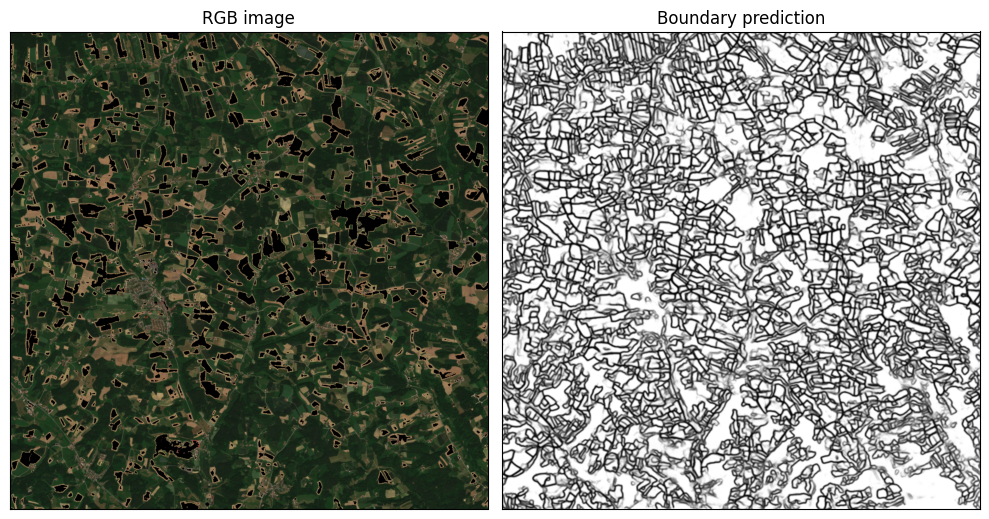

In [4]:
from stelar_spatiotemporal.eopatch_functions import plot_rgb

# Let's experiment with a patchlet
eop_path = os.path.join(plet_dir, "patchlet_4_4")
eop = EOPatch.load(eop_path, lazy_loading=True)

# plot RGB and segmentation
fig, axes = plt.subplots(1, 2, figsize=(10, 10))

plot_rgb(eop, 0, axes[0])
axes[0].set_title("RGB image")
axes[0].set_xticks([])
axes[0].set_yticks([])

axes[1].imshow(eop.data_timeless['SEGMENTATION'][..., 0], vmin=0, vmax=1, cmap='gray')
axes[1].set_title("Boundary prediction")
axes[1].set_xticks([])
axes[1].set_yticks([])
plt.tight_layout()

In [8]:
preds = eop.data_timeless['SEGMENTATION'][..., 0]

preds.shape

(4512, 4512)

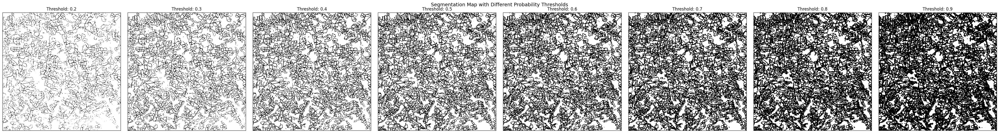

In [50]:
import numpy as np

import matplotlib.pyplot as plt

# Create three different thresholds for the segmentation map
thresholds = np.arange(0.2, 1, 0.1)

thresholds = [round(th,2) for th in thresholds]

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, len(thresholds), figsize=(5*len(thresholds), 5))

# Process and display each thresholded segmentation map
for i, threshold in enumerate(thresholds):
    # Apply threshold to the predictions
    thresholded_map = (preds > threshold).astype(int)
    
    # Plot the thresholded segmentation map
    im = axes[i].imshow(thresholded_map, cmap='gray', vmin=0, vmax=1)
    axes[i].set_title(f'Threshold: {threshold}')
    axes[i].set_xticks([])
    axes[i].set_yticks([])

plt.tight_layout()
plt.suptitle('Segmentation Map with Different Probability Thresholds', y=1.05, fontsize=14)
plt.show()

Seems that the lines just get thicker when we go over a threshold of 0.7 (mind that the probability is inverted; high values mean no boundary, low values mean boundary).

Let's run gdal_contour with different thresholds and see what we get

In [20]:
from stelar_spatiotemporal.segmentation.segmentation import prediction_to_tiff, unpack_contours

# First create a tiff file with the segmentation
tiff_dir = os.path.join(LOCAL_DIR, "tiffs")

tiff_path = prediction_to_tiff(eop_path, tiff_dir)

tiff_path

'/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/tiffs/tiffs/patchlet_4_4.tiff'

In [48]:
# Vectorize the segmentation map with different thresholds

for threshold in thresholds:

    print(f"Vectorizing with threshold {threshold}")

    vec_path = os.path.join(vecs_dir, f"patchlet_4_4_threshold_{threshold}.gpkg")

    if os.path.exists(vec_path):
        print(f"File {vec_path} already exists. Skipping...")
        continue

    gdal_str = f"gdal_contour -of gpkg {tiff_path} {vec_path} -fl {threshold} -amin amin -amax amax -p > /dev/null"
    os.system(gdal_str)

    # Unpack contours from tiff file
    df = unpack_contours(vec_path, threshold)

    # Remove temporary file
    os.remove(vec_path)

    # Save as geopackage
    df.to_file(vec_path, driver='GPKG', mode='w')

Vectorizing with threshold 0.2
Vectorizing with threshold 0.3
File /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/contours/patchlet_4_4_threshold_0.3.gpkg already exists. Skipping...
Vectorizing with threshold 0.4
File /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/contours/patchlet_4_4_threshold_0.4.gpkg already exists. Skipping...
Vectorizing with threshold 0.5
File /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/contours/patchlet_4_4_threshold_0.5.gpkg already exists. Skipping...
Vectorizing with threshold 0.6
File /home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/contours/patchlet_4_4_threshold_0.6.gpkg already exists. Skipping...
Vectorizing with threshold 0.7
File /home/jens/ownCloud/Documents/3.Werk/0.TU

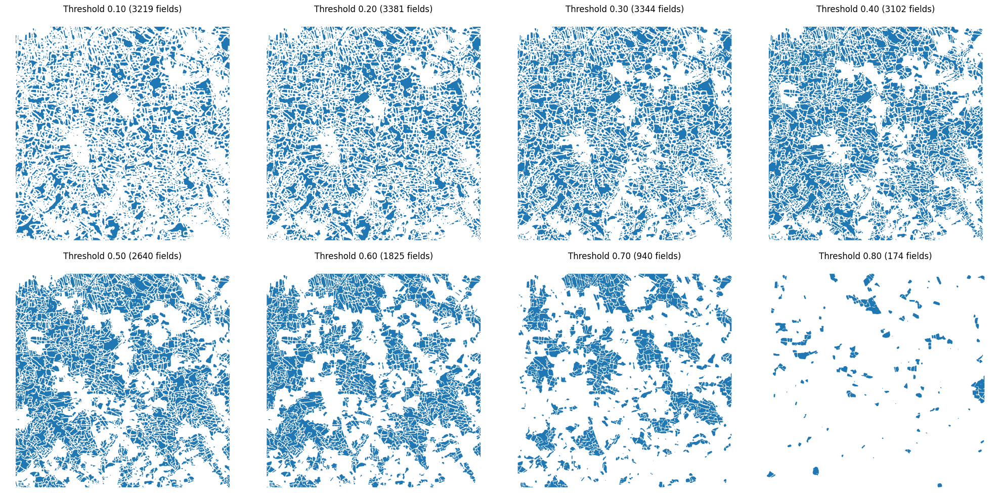

In [54]:
# Let's analyze the output geodataframes
import geopandas as gpd

n = len(thresholds)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

axes = axes.flatten()

for i,th in enumerate(thresholds[::-1]):
    vec_path = os.path.join(vecs_dir, f"patchlet_4_4_threshold_{th}.gpkg")

    df = gpd.read_file(vec_path)

    # Filter down to not extremely big fields
    minarea = 0  # 1 km2
    maxarea = 500_000  # 50 hectares
    df = df[(df.geometry.area > minarea) & (df.geometry.area < maxarea)]

    # Print the number of fields

    df.plot(ax=axes[i])
    axes[i].set_title(f"Threshold {1-th:.2f} ({len(df)} fields)")
    axes[i].set_xticks([])
    axes[i].set_yticks([])

    # Remove ax lines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].spines['left'].set_visible(False)
    axes[i].spines['bottom'].set_visible(False)


outdir = "/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/Deliverables/D3 Spatiotemporal data alignment (v2)/figs"


plt.tight_layout()

fig.savefig(os.path.join(outdir, "thresholds.png"), dpi=300, bbox_inches='tight')

In [5]:
from stelar_spatiotemporal.segmentation.segmentation import vectorize_patchlets

# Vectorize patchlets
print("Vectorizing segmentated patchlets")
vectorize_patchlets(plet_dir, outdir=vecs_dir, threshold=0.8)

Vectorizing segmentated patchlets
Skipping patchlet_1_9 as it is already vectorizedSkipping patchlet_7_0 as it is already vectorizedSkipping patchlet_4_3 as it is already vectorizedSkipping patchlet_0_4 as it is already vectorizedSkipping patchlet_1_4 as it is already vectorizedSkipping patchlet_6_2 as it is already vectorizedSkipping patchlet_10_9 as it is already vectorizedSkipping patchlet_0_2 as it is already vectorized




  0%|          | 0/144 [00:00<?, ?it/s]




Skipping patchlet_0_5 as it is already vectorized
Skipping patchlet_10_4 as it is already vectorized
Skipping patchlet_0_11 as it is already vectorizedSkipping patchlet_3_6 as it is already vectorized
Skipping patchlet_7_9 as it is already vectorizedSkipping patchlet_4_7 as it is already vectorized
Skipping patchlet_1_10 as it is already vectorized

Skipping patchlet_11_10 as it is already vectorized

Skipping patchlet_5_10 as it is already vectorizedSkipping patchlet_2_5 as it is already vectorizedSkipping patchlet_5_0 as it is already vectorized

Skipping patchlet_2_4 as it is already vectorizedSkipping patchlet_0_8 as it is already vectorized

Skipping patchlet_4_6 as it is already vectorized
Skipping patchlet_3_0 as it is already vectorizedSkipping patchlet_2_6 as it is already vectorized

Skipping patchlet_7_11 as it is already vectorized
Skipping patchlet_3_4 as it is already vectorizedSkipping patchlet_0_0 as it is already vectorized

Skipping patchlet_1_1 as it is already ve

100%|██████████| 144/144 [00:23<00:00,  6.09it/s]


OSError: [Errno 39] Directory not empty: '/home/jens/ownCloud/Documents/3.Werk/0.TUe_Research/0.STELAR/0.VISTA/VISTA_workbench/data/evaluation/33uup/28-05-2023/contours/tiffs'

In [ ]:
# Check overlap between patchlets
from stelar_spatiotemporal.eolearn.core import EOPatch, BBox

p1 = EOPatch.load(os.path.join(plet_dir, "patchlet_0_0"), lazy_loading=True)
p2 = EOPatch.load(os.path.join(plet_dir, "patchlet_1_0"), lazy_loading=True)

print(p1.bbox)
print(p2.bbox)

299005.0,5389715.0,310285.0,5400995.0
309285.0,5389715.0,320565.0,5400995.0


In [14]:
# Get intersection between bounding boxes


p1geom = p1.bbox.geometry
p2geom = p2.bbox.geometry

p1geom.intersection(p2geom).bounds

(309285.0, 5389715.0, 310285.0, 5400995.0)

In [33]:
dfs = [gpd.read_file(os.path.join(vecs_dir, f"patchlet_{i}_{j}.gpkg")) for i in range(2) for j in range(2)]

for df in dfs:
    print(df.total_bounds)

[ 299005. 5389715.  310285. 5400995.]
[ 299005. 5379435.  310285. 5390715.]
[ 309285. 5389715.  320565. 5400995.]
[ 309285. 5379435.  320565. 5390715.]


Text(0.5, 0, 'Longitude')

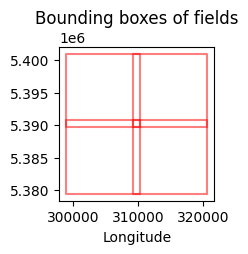

In [34]:
# Get all the bounding boxes of the fields as shapes
from shapely.geometry import box

boxes = [box(*df.total_bounds) for df in dfs]

# Plot all boxes
fig, ax = plt.subplots(figsize=(2, 2))

for box in boxes:
    x, y = box.exterior.xy
    ax.plot(x, y, color='red', alpha=0.5)
ax.set_title("Bounding boxes of fields")
ax.set_xlabel("Longitude")

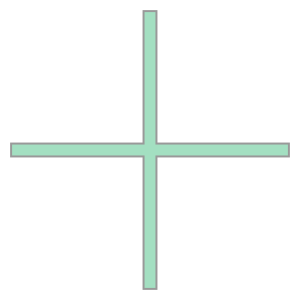

In [35]:
# Get the union of intersections of all boxes
from shapely.ops import unary_union

total_intersection = unary_union([box.intersection(other_box) for box in boxes for other_box in boxes if box != other_box])

total_intersection

/tmp/ipykernel_310098/3601134994.py:13: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  isct_df = isct_df.dissolve().explode()


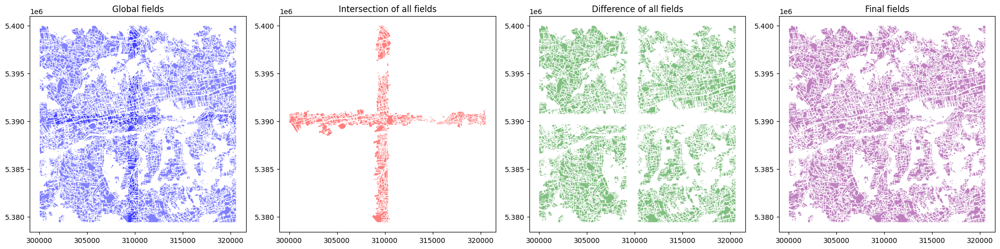

In [48]:
# Ok, now we will create the global dataframe, the intersection dataframe, and the difference dataframe

# Create a global dataframe with all fields
global_df = pd.concat(dfs)

# Keep only the fields that are totally within the bounding box
global_df = global_df[global_df.geometry.area < 1e6]

# Get the intersection of all fields (i.e., keep only the fields in global_df that have some area in common with shape_df)
isct_df = global_df[global_df.intersects(total_intersection)]

# Take the union of the fields in the sntersection to make sure we do not have duplicates
isct_df = isct_df.dissolve().explode()

# Get the difference of all fields (i.e., keep only the fields in global_df that do not have any area in common with shape_df)
diff_df = global_df[~global_df.intersects(total_intersection)]

# Now combine the intersection and difference dataframes to get the final dataframe
final_df = pd.concat([isct_df, diff_df], ignore_index=True)

# Plot the dataframes side by side
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
global_df.plot(ax=axes[0], color='blue', alpha=0.5)
axes[0].set_title("Global fields")

isct_df.plot(ax=axes[1], color='red', alpha=0.5)
axes[1].set_title("Intersection of all fields")

diff_df.plot(ax=axes[2], color='green', alpha=0.5)
axes[2].set_title("Difference of all fields")

final_df.plot(ax=axes[3], color='purple', alpha=0.5)
axes[3].set_title("Final fields")

plt.tight_layout()
plt.show()


In [ ]:
from stelar_spatiotemporal.segmentation.segmentation import combine_patchlet_shapes

n_fields = combine_patchlet_shapes(vecs_dir, outpath=os.path.join(LOCAL_DIR, "combined.gpkg"))

In [21]:
df = gpd.read_file(os.path.join(LOCAL_DIR, "combined.gpkg"))

df

,geometry
0,"POLYGON ((301148.750 5297006.000, 301148.375 5..."
1,"POLYGON ((301009.500 5297083.750, 301008.750 5..."
2,"POLYGON ((300611.250 5297056.375, 300608.750 5..."
3,"POLYGON ((301550.068 5297171.250, 301548.932 5..."
4,"POLYGON ((301701.250 5297195.000, 301700.000 5..."
...,...
221646,"POLYGON ((408311.917 5339343.750, 408311.250 5..."
221647,"POLYGON ((407292.750 5339331.250, 407291.250 5..."
221648,"POLYGON ((409345.083 5339331.250, 409343.750 5..."
221649,"POLYGON ((403936.000 5339323.750, 403933.750 5..."
